<h1 align="center"><strong>Projet Data Science</h3> <h1 align="center">Livrable 2 : Autoencodeur</strong></h3> 

### Importation des bibliothèques nécessaires

Nous allons importer les bibliothèques essentielles pour notre projet d'autoencodeur. Ces bibliothèques incluent :

- **os** : pour interagir avec le système de fichiers.
- **numpy** : pour les opérations sur les tableaux et les matrices.
- **matplotlib.pyplot** : pour la visualisation des données.
- **tensorflow** : pour construire et entraîner notre modèle d'autoencodeur.
- **keras.layers** : pour définir les différentes couches de notre modèle.
- **keras.models** : pour créer le modèle.
- **keras.preprocessing** : pour le prétraitement des images.
- **sklearn.model_selection** : pour diviser les données en ensembles d'entraînement et de test.
- **sklearn.metrics** : pour évaluer la performance du modèle.
- **skimage.metrics** : pour calculer le rapport signal-bruit de crête (PSNR).


In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D
from keras.models import Model
from keras.preprocessing import image
from keras.preprocessing.image import ImageDataGenerator

from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from skimage.metrics import peak_signal_noise_ratio as psnr

print("Import terminé.")


Import terminé.


### Chargement des images

Nous allons charger les images à partir du répertoire spécifié. Les paramètres des images sont définis pour redimensionner chaque image à 256x256 pixels avec 3 canaux de couleur (RGB). 


In [2]:
data_dir = 'Dataset noisy'
image_files = os.listdir(data_dir)

# Paramètres des images
img_height, img_width, rgb = 180, 180, 3
input_img = Input(shape=(img_height, img_width, rgb))
images = []

for img_file in image_files:
    img_path = os.path.join(data_dir, img_file)
    img = image.load_img(img_path, target_size=(256, 256))
    img_array = image.img_to_array(img)
    images.append(img_array)

images = np.array(images)

print("Chargement terminé.")


Chargement terminé.


### Affichage des informations de base sur les données

Nous allons afficher quelques informations essentielles concernant les images chargées, y compris le nombre total d'images, leurs dimensions, ainsi que les valeurs minimales et maximales des pixels.

In [4]:
# Afficher quelques informations de base sur les données
print(f"Nombre total d'images : {images.shape[0]}")
print(f"Dimensions des images : {images.shape[1:]}")
print(f"Valeur min des pixels : {np.min(images)}")
print(f"Valeur max des pixels : {np.max(images)}")

Nombre total d'images : 148
Dimensions des images : (256, 256, 3)
Valeur min des pixels : 0.0
Valeur max des pixels : 255.0


### Affichage de quelques images du dataset

Dans cette section, nous allons afficher un échantillon de 9 images provenant du dataset. Cela nous permettra de visualiser les données que nous allons utiliser pour entraîner notre modèle d'autoencodeur. Chaque image est affichée sans axes pour une meilleure clarté.

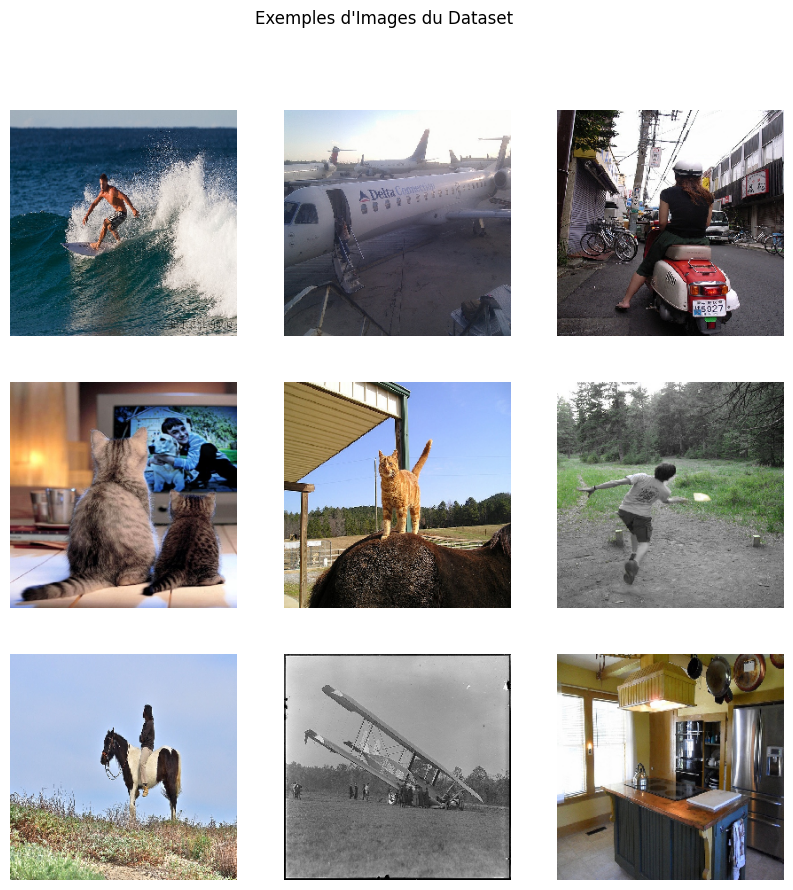

In [5]:
# Afficher quelques images
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(images[i].astype('uint8'))
    plt.axis('off')
plt.suptitle('Exemples d\'Images du Dataset')
plt.show()

### Calcul de la distribution des valeurs de pixel

Dans cette section, nous allons analyser la distribution des valeurs de pixel dans notre dataset d'images. Cela nous aidera à comprendre la variation des intensités de pixel et à identifier d'éventuelles anomalies. Nous allons également calculer la moyenne et l'écart-type des valeurs de pixel, ce qui nous donnera des informations supplémentaires sur la luminosité générale des images.

1. **Histogramme des valeurs de pixel** : Nous allons tracer un histogramme pour visualiser la distribution des valeurs de pixel.
2. **Statistiques des valeurs de pixel** : Nous allons calculer et afficher la moyenne et l'écart-type des valeurs de pixel.

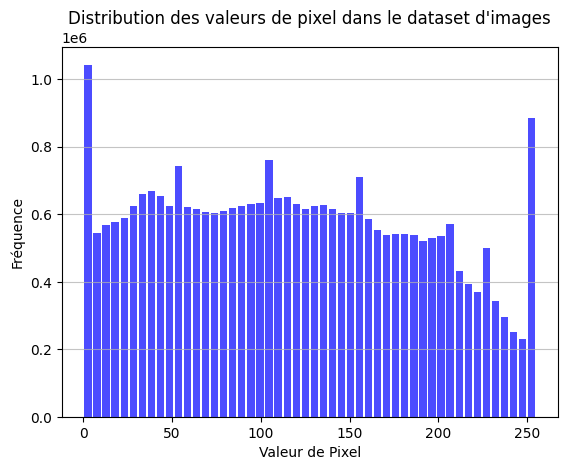

La valeur moyenne des pixels est: 117.62
L'écart-type des valeurs de pixel est: 71.52


In [6]:
# Calculer la distribution des valeurs de pixel
pixel_values = images.flatten()
plt.hist(pixel_values, bins=50, color='blue', alpha=0.7, rwidth=0.8)
plt.title('Distribution des valeurs de pixel dans le dataset d\'images')
plt.xlabel('Valeur de Pixel')
plt.ylabel('Fréquence')
plt.grid(axis='y', alpha=0.75)
plt.show()

# Calculer et afficher la moyenne et l'écart-type des valeurs de pixel
mean_pixel_value = np.mean(pixel_values)
std_pixel_value = np.std(pixel_values)
print(f"La valeur moyenne des pixels est: {mean_pixel_value:.2f}")
print(f"L'écart-type des valeurs de pixel est: {std_pixel_value:.2f}")

### Normalisation des images

Dans cette section, nous allons normaliser les images pour que les valeurs de pixel soient comprises entre 0 et 1. La normalisation est une étape cruciale dans le prétraitement des données, car elle permet d'améliorer la convergence du modèle lors de l'entraînement. En divisant les valeurs de pixel par 255, nous transformons les valeurs d'intensité de couleur, qui étaient initialement dans la plage [0, 255], en une plage plus appropriée pour les réseaux de neurones.

In [7]:
# Normaliser les images pour que les valeurs de pixel soient dans [0, 1]
normalized_images = images / 255.0

print("Normalisation terminé.")

Normalisation terminé.


### Ajout de bruit aux images

Dans cette section, nous allons ajouter du bruit gaussien aux images normalisées pour simuler des conditions réelles où les images peuvent être corrompues par du bruit. Nous allons créer deux ensembles d'images bruitées :

1. **Bruit léger** : Un facteur de bruit de 0.15 sera appliqué pour générer des images légèrement bruitées.
2. **Bruit fort** : Un facteur de bruit de 0.40 sera appliqué pour générer des images fortement bruitées.

L'ajout de bruit est une technique courante dans l'entraînement des modèles d'autoencodeurs, car cela aide le modèle à apprendre à reconstruire des images à partir de données corrompues.

In [8]:
# Paramètres pour l'ajout de bruit
noise_factor_015 = 0.15
noise_factor_040 = 0.40

# Ajout d'un bruit gaussien léger aux images
noisy_images_015 = normalized_images + noise_factor_015 * np.random.normal(loc=0.0, scale=1.0, size=normalized_images.shape)
noisy_images_015 = np.clip(noisy_images_015, 0., 1.)

# Ajout d'un bruit gaussien fort aux images
noisy_images_040 = normalized_images + noise_factor_040 * np.random.normal(loc=0.0, scale=1.0, size=normalized_images.shape)
noisy_images_040 = np.clip(noisy_images_040, 0., 1.)

print("Bruitage terminé.")

Bruitage terminé.


### Division des données en ensembles d'entraînement et de test

Dans cette section, nous allons diviser nos données en ensembles d'entraînement et de test. Cela nous permettra d'évaluer la performance de notre modèle sur des données qu'il n'a pas vues pendant l'entraînement. Nous allons créer deux ensembles distincts pour les images bruitées avec différents niveaux de bruit :

1. **Ensemble avec bruit léger (0.15)** : Les images bruitées seront utilisées comme entrées, tandis que les images originales serviront de cibles.
2. **Ensemble avec bruit fort (0.40)** : De même, cet ensemble utilisera les images fortement bruitées comme entrées.

Nous utiliserons une proportion de 20 % des données pour le test, ce qui est une pratique courante pour garantir une évaluation fiable du modèle.

In [9]:
# Diviser les données en ensembles d'entraînement et de test
X_train_015, X_test_015, y_train_015, y_test_015 = train_test_split(
    noisy_images_015,   # Entrée (images bruitées)
    normalized_images,  # Cibles (images originales)
    test_size=0.2,
    random_state=42
)

# Diviser les données en ensembles d'entraînement et de test
X_train_040, X_test_040, y_train_040, y_test_040 = train_test_split(
    noisy_images_040,   # Entrée (images bruitées)
    normalized_images,  # Cibles (images originales)
    test_size=0.2,
    random_state=42
)

print("Jeux de données constitués")

Jeux de données constitués


### Affichage des images bruitées

Dans cette section, nous allons visualiser quelques exemples d'images bruitées pour évaluer l'impact du bruit ajouté. Nous afficherons deux ensembles d'images :

1. **Images légèrement bruitées** : Nous montrerons un échantillon d'images avec un bruit gaussien léger (facteur de 0.15).
2. **Images fortement bruitées** : Nous montrerons un échantillon d'images avec un bruit gaussien fort (facteur de 0.40).

Cela nous permettra de mieux comprendre la qualité des données d'entrée que notre modèle devra traiter.

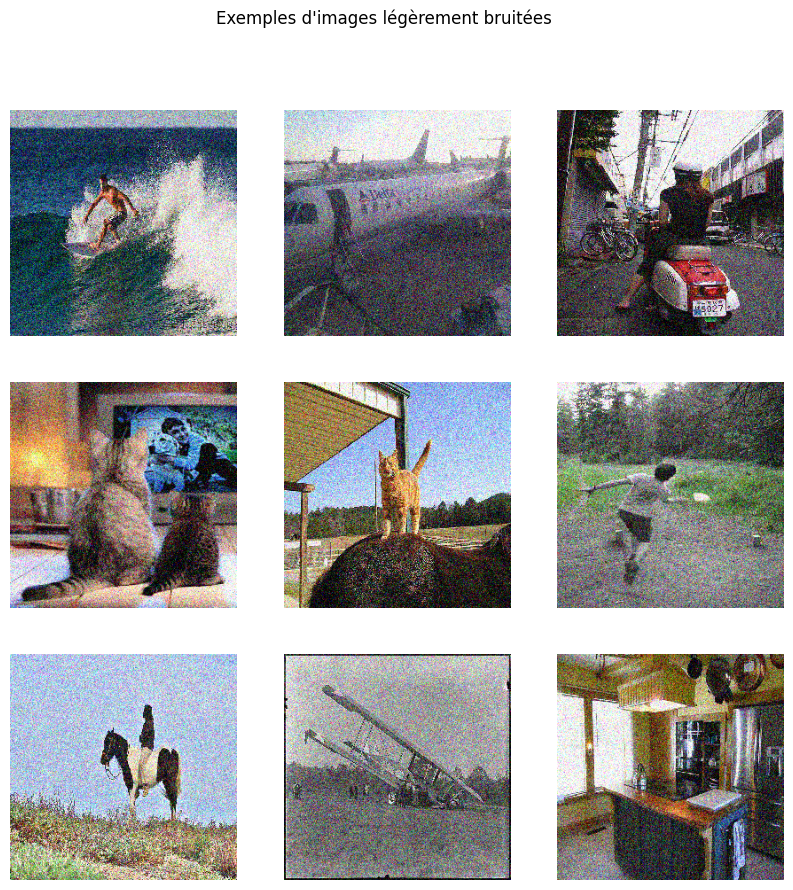

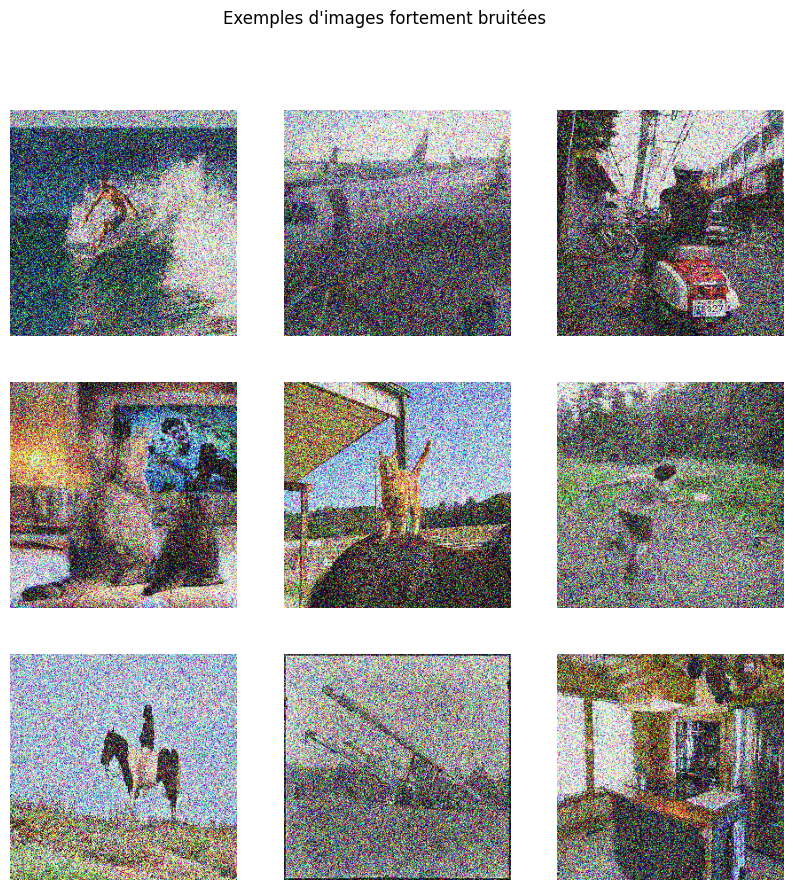

In [10]:
# Afficher quelques images légèrement bruitées
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(noisy_images_015[i].astype('float32'))
    plt.axis('off')
plt.suptitle('Exemples d\'images légèrement bruitées')
plt.show()

# Afficher quelques images fortement bruitées
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(noisy_images_040[i].astype('float32'))
    plt.axis('off')
plt.suptitle('Exemples d\'images fortement bruitées')
plt.show()

In [11]:
# Définition des images
input_img = Input(shape=(img_height, img_width, rgb))

print("Paramètres appliqués.")

Paramètres appliqués.


### Paramétrage de l'encodeur

Dans cette section, nous allons définir les paramètres de l'encodeur de notre modèle d'autoencodeur. L'encodeur est responsable de la compression des images d'entrée en une représentation de plus petite dimension. Voici les détails des paramètres que nous allons utiliser :

- **Filtres** : Le nombre de filtres dans chaque couche de convolution.
- **Taille du noyau** : La taille du noyau de convolution, qui détermine la zone de l'image que chaque filtre examine.
- **Activation** : La fonction d'activation utilisée pour introduire de la non-linéarité dans le modèle.
- **Padding** : La méthode de remplissage utilisée pour conserver la taille des images après la convolution.
- **Taille de pooling** : La taille de la fenêtre de pooling pour réduire la dimensionnalité.

Nous allons appliquer ces paramètres à travers plusieurs couches de convolution et de pooling pour construire l'encodeur.


In [12]:
# Paramètres de l'encodeur
encoder_params = [
    {"filters": 64, "kernel_size": (3, 3), "activation": 'relu', "padding": 'same'},
    {"pool_size": (2, 2), "padding": 'same'},
    {"filters": 128, "kernel_size": (3, 3), "activation": 'relu', "padding": 'same'},
    {"pool_size": (2, 2), "padding": 'same'}
]

# Encodeur
x = input_img
for i in range(0, len(encoder_params), 2):
    x = Conv2D(**encoder_params[i])(x)
    x = MaxPooling2D(**encoder_params[i+1])(x)
encoded = x

print("Encodeur paramétré.")


Encodeur paramétré.


### Paramétrage du décodeur

Dans cette section, nous allons définir les paramètres du décodeur de notre modèle d'autoencodeur. Le décodeur a pour rôle de reconstruire les images à partir de la représentation compressée fournie par l'encodeur. Voici les détails des paramètres que nous allons utiliser :

- **Filtres** : Le nombre de filtres dans chaque couche de convolution.
- **Taille du noyau** : La taille du noyau de convolution.
- **Activation** : La fonction d'activation utilisée pour la reconstruction des images.
- **Taille de l'upsampling** : La taille de la fenêtre utilisée pour augmenter la dimensionnalité des images.

Nous allons appliquer ces paramètres à travers plusieurs couches de convolution et d'upsampling pour construire le décodeur, en veillant à ce que la sortie finale ait la même dimension que l'image d'entrée.


In [13]:
# Paramètres du décodeur
decoder_params = [
    {"filters": 128, "kernel_size": (3, 3), "activation": 'relu', "padding": 'same'},
    {"size": (2, 2)},
    {"filters": 64, "kernel_size": (3, 3), "activation": 'relu', "padding": 'same'},
    {"size": (2, 2)},
    {"filters": rgb, "kernel_size": (3, 3), "activation": 'sigmoid', "padding": 'same'}
]

# Décodeur
for i in range(0, len(decoder_params)-1, 2):
    x = Conv2D(**decoder_params[i])(x)
    x = UpSampling2D(**decoder_params[i+1])(x)
x = Conv2D(**decoder_params[-1])(x)
decoded = x

print("Décodeur paramétré.")

Décodeur paramétré.


### Construction du modèle d'auto-encodeur complet

Dans cette section, nous allons construire le modèle d'auto-encodeur en combinant l'encodeur et le décodeur que nous avons définis précédemment. Nous allons également afficher un résumé du modèle pour visualiser la structure et les paramètres.

1. **Modèle d'auto-encodeur** : Nous créons le modèle en spécifiant l'image d'entrée et la sortie reconstruite.
2. **Résumé du modèle** : Cela nous permet de vérifier la configuration du modèle, y compris le nombre de couches et les paramètres.
3. **Augmentation des données** : Nous mettons en place une augmentation des données pour améliorer la robustesse du modèle en générant des variations des images d'entraînement.
4. **Compilation du modèle** : Nous compilons le modèle en spécifiant l'optimiseur et la fonction de perte.
5. **Sauvegarde du modèle** : Enfin, nous sauvegardons le modèle entraîné pour une utilisation future.

In [14]:
# Construction du modèle d'auto-encodeur complet
autoencoder = Model(input_img, decoded)
autoencoder.summary()

# Augmentation des données
datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.1,
    height_shift_range=0.1,
    horizontal_flip=True,
    vertical_flip=True
)

autoencoder.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

autoencoder.save("autoencoder_model.h5")

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 256, 256, 3)]     0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 64)      1792      
                                                                 
 max_pooling2d (MaxPooling2  (None, 128, 128, 64)      0         
 D)                                                              
                                                                 
 conv2d_1 (Conv2D)           (None, 128, 128, 128)     73856     
                                                                 
 max_pooling2d_1 (MaxPoolin  (None, 64, 64, 128)       0         
 g2D)                                                            
                                                                 
 conv2d_2 (Conv2D)           (None, 64, 64, 128)       147584

c:\Users\Téo\AppData\Local\Programs\Python\Python310\lib\site-packages\keras\src\engine\training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


### Définition des paramètres globaux

Dans cette section, nous allons définir les paramètres globaux pour l'entraînement de notre modèle d'autoencodeur. Ces paramètres incluent :

1. **Époques** : Le nombre total d'époques pour l'entraînement, ici fixé à 150.
2. **Taille du lot** : Le nombre d'échantillons traités avant que le modèle ne soit mis à jour, ici fixé à 4.

Nous mettrons également en place un mécanisme d'**Early Stopping** pour éviter le surapprentissage. Cela permettra d'arrêter l'entraînement si la perte de validation ne s'améliore pas pendant un certain nombre d'époques, tout en restaurant les meilleurs poids du modèle.

In [15]:
# Paramètres globaux
epochs = 150
batch_size = 4

# Early Stopping
early_stopping = tf.keras.callbacks.EarlyStopping(
    monitor='val_loss',
    verbose=1,
    patience=10,
    restore_best_weights=True)

print("Hyperparamètres définis.")

Hyperparamètres définis.


### Entraînement de l'auto-encodeur avec bruit léger

Dans cette section, nous allons entraîner notre modèle d'auto-encodeur en utilisant les images bruitées avec un facteur de bruit de 0.15. Nous allons spécifier les données d'entraînement et de validation, ainsi que les paramètres d'entraînement définis précédemment.

1. **Données d'entraînement** : Les images bruitées serviront d'entrées, tandis que les images originales seront les cibles.
2. **Époques et taille du lot** : Nous utiliserons les valeurs définies pour le nombre d'époques et la taille du lot.
3. **Validation** : Nous évaluerons le modèle sur un ensemble de test pour suivre sa performance.
4. **Callbacks** : Nous utiliserons l'early stopping pour éviter le surapprentissage.

In [16]:
history_015 = autoencoder.fit(
    X_train_015,  # images bruitées
    y_train_015,  # images originales
    epochs=epochs,
    batch_size=batch_size,
    shuffle=True,
    validation_data=(X_test_015, y_test_015),
    callbacks=[early_stopping],
)

print("Auto-encodeur 015 entraîné.")

Epoch 1/150

30/30 [==============================] - 10s 304ms/step - loss: 0.6041 - accuracy: 0.4382 - val_loss: 0.5832 - val_accuracy: 0.3277
Epoch 2/150
30/30 [==============================] - 10s 324ms/step - loss: 0.5555 - accuracy: 0.5430 - val_loss: 0.5521 - val_accuracy: 0.6950
Epoch 3/150
30/30 [==============================] - 10s 320ms/step - loss: 0.5468 - accuracy: 0.6525 - val_loss: 0.5535 - val_accuracy: 0.5647
Epoch 4/150
30/30 [==============================] - 10s 347ms/step - loss: 0.5390 - accuracy: 0.6727 - val_loss: 0.5473 - val_accuracy: 0.6420
Epoch 5/150
30/30 [==============================] - 12s 395ms/step - loss: 0.5344 - accuracy: 0.6658 - val_loss: 0.5396 - val_accuracy: 0.7229
Epoch 6/150
30/30 [==============================] - 11s 358ms/step - loss: 0.5331 - accuracy: 0.6987 - val_loss: 0.5426 - val_accuracy: 0.7215
Epoch 7/150
30/30 [==============================] - 11s 359ms/step - loss: 0.5318 - accuracy: 0.7195 - val_loss: 0.5368 - val_accuracy

### Entraînement de l'auto-encodeur avec bruit fort

Dans cette section, nous allons entraîner notre modèle d'auto-encodeur en utilisant les images bruitées avec un facteur de bruit de 0.40. Comme précédemment, nous allons spécifier les données d'entraînement et de validation, ainsi que les paramètres d'entraînement.

1. **Données d'entraînement** : Les images fortement bruitées serviront d'entrées, tandis que les images originales seront les cibles.
2. **Époques et taille du lot** : Nous utiliserons les mêmes valeurs définies pour le nombre d'époques et la taille du lot.
3. **Validation** : Nous évaluerons le modèle sur un ensemble de test pour suivre sa performance.
4. **Callbacks** : L'early stopping sera également utilisé pour éviter le surapprentissage.

In [17]:
history_040 = autoencoder.fit(
    X_train_040,  # images bruitées
    y_train_040,  # images originales
    epochs=epochs,
    batch_size=batch_size,
    shuffle=True,
    validation_data=(X_test_040, y_test_040),
    callbacks=[early_stopping],
)

print("Auto-encodeur 040 entraîné.")

Epoch 1/150
30/30 [==============================] - 10s 326ms/step - loss: 0.5354 - accuracy: 0.6463 - val_loss: 0.5403 - val_accuracy: 0.6502
Epoch 2/150
30/30 [==============================] - 10s 329ms/step - loss: 0.5308 - accuracy: 0.6587 - val_loss: 0.5337 - val_accuracy: 0.7292
Epoch 3/150
30/30 [==============================] - 10s 331ms/step - loss: 0.5285 - accuracy: 0.7099 - val_loss: 0.5327 - val_accuracy: 0.7342
Epoch 4/150
30/30 [==============================] - 10s 325ms/step - loss: 0.5281 - accuracy: 0.7111 - val_loss: 0.5331 - val_accuracy: 0.7301
Epoch 5/150
30/30 [==============================] - 10s 326ms/step - loss: 0.5278 - accuracy: 0.7078 - val_loss: 0.5322 - val_accuracy: 0.7276
Epoch 6/150
30/30 [==============================] - 10s 323ms/step - loss: 0.5276 - accuracy: 0.7129 - val_loss: 0.5343 - val_accuracy: 0.7295
Epoch 7/150
30/30 [==============================] - 10s 348ms/step - loss: 0.5276 - accuracy: 0.7186 - val_loss: 0.5316 - val_accuracy:

### Traçage de l'historique de la perte durant l'entraînement

Dans cette section, nous allons visualiser l'évolution de la perte durant l'entraînement pour les deux modèles d'auto-encodeurs, l'un entraîné avec des images légèrement bruitées et l'autre avec des images fortement bruitées. 

1. **Perte d'entraînement et de validation** : Nous allons tracer les courbes de perte pour les ensembles d'entraînement et de test afin d'évaluer la performance du modèle au fil des époques.
2. **Interprétation des courbes** : Ces graphiques nous permettront de vérifier si le modèle est en train de surapprendre ou s'il généralise bien sur les données de test.`


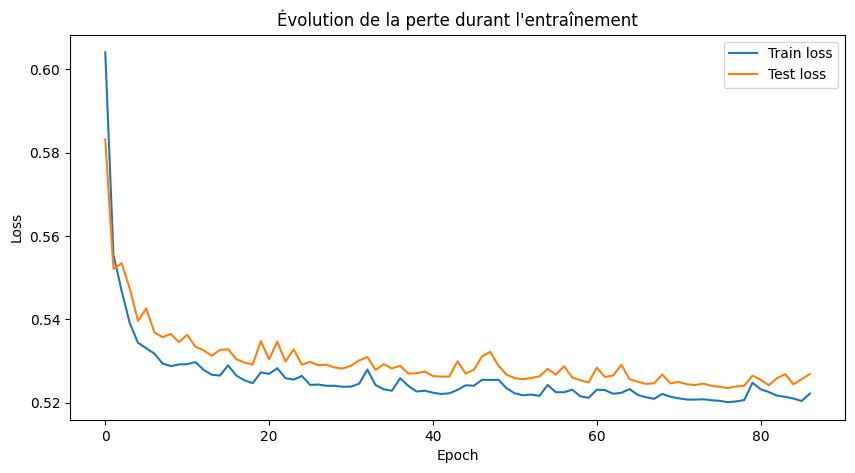

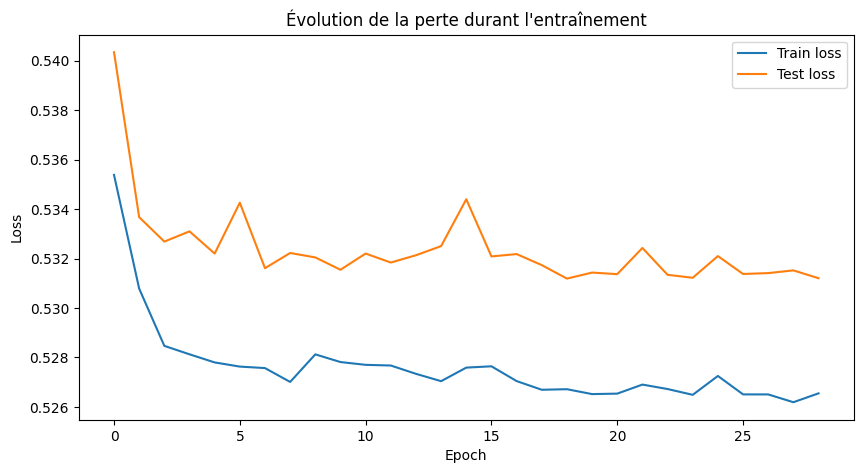

In [18]:
# Tracer l'historique de la perte durant l'entraînement (images légèrement bruitées)
plt.figure(figsize=(10, 5))
plt.plot(history_015.history['loss'], label='Train loss')
plt.plot(history_015.history['val_loss'], label='Test loss')
plt.title('Évolution de la perte durant l\'entraînement')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

# Tracer l'historique de la perte durant l'entraînement (images fortement bruitées)
plt.figure(figsize=(10, 5))
plt.plot(history_040.history['loss'], label='Train loss')
plt.plot(history_040.history['val_loss'], label='Test loss')
plt.title('Évolution de la perte durant l\'entraînement')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show()

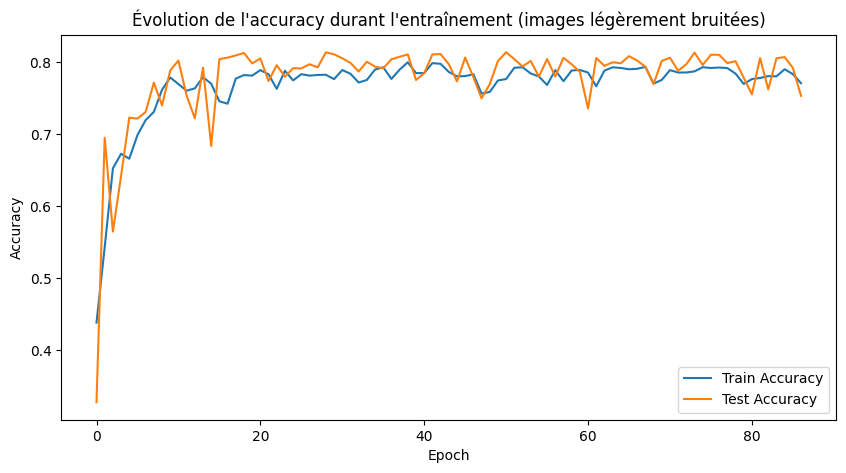

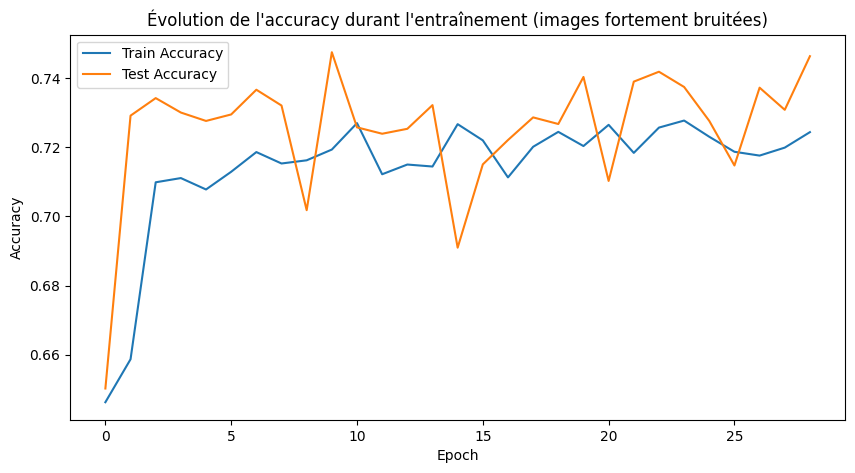

In [19]:
# Tracer l'historique de l'accuracy durant l'entraînement (images légèrement bruitées)
plt.figure(figsize=(10, 5))
plt.plot(history_015.history['accuracy'], label='Train Accuracy')
plt.plot(history_015.history['val_accuracy'], label='Test Accuracy')
plt.title('Évolution de l\'accuracy durant l\'entraînement (images légèrement bruitées)')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

# Tracer l'historique de l'accuracy durant l'entraînement (images fortement bruitées)
plt.figure(figsize=(10, 5))
plt.plot(history_040.history['accuracy'], label='Train Accuracy')
plt.plot(history_040.history['val_accuracy'], label='Test Accuracy')
plt.title('Évolution de l\'accuracy durant l\'entraînement (images fortement bruitées)')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

### Prédiction des images débruitées et évaluation des performances

Dans cette section, nous allons prédire les images débruitées à partir des images bruitées de test et évaluer la performance de notre modèle en utilisant le PSNR (Peak Signal-to-Noise Ratio).

1. **Prédiction** : Nous utiliserons le modèle entraîné pour générer des images débruitées à partir des ensembles de test.
2. **Calcul du PSNR** : Pour chaque paire d'images (originale et prédite), nous allons calculer le PSNR, qui est une mesure de la qualité de la reconstruction. Un PSNR plus élevé indique une meilleure qualité d'image.
3. **Moyenne du PSNR** : Nous calculerons la moyenne du PSNR pour les images légèrement bruitées (0.15) et fortement bruitées (0.40) afin de comparer les performances des deux modèles.

In [20]:
# Prédiction des images débruitées à partir des images bruitées de test
decoded_imgs_015 = autoencoder.predict(X_test_015)
decoded_imgs_040 = autoencoder.predict(X_test_040)

# Initialisation des métriques
psnr_vals = []

# Calcul du PNSR pour les images ayant été légèrement bruitées
for orig, pred in zip(y_test_015, decoded_imgs_015):
    orig = orig.astype("float32")
    pred = pred.astype("float32")
    
    # Calcul et stockage du PSNR pour chaque paire d'images
    psnr_vals.append(psnr(orig, pred, data_range=orig.max() - orig.min()))

# Calcul de la moyenne du PSNR
mean_psnr = np.mean(psnr_vals)
print(f"Mean PSNR (0.15): {mean_psnr:.2f}")

# Réinitialisation des métriques
psnr_vals = []

# Calcul du PNSR pour les images ayant été fortement bruitées
for orig, pred in zip(y_test_040, decoded_imgs_040):
    orig = orig.astype("float32")
    pred = pred.astype("float32")
    
    # Calcul et stockage du PSNR pour chaque paire d'images
    psnr_vals.append(psnr(orig, pred, data_range=orig.max() - orig.min()))

# Calcul de la moyenne du PSNR
mean_psnr = np.mean(psnr_vals)
print(f"Mean PSNR (0.40): {mean_psnr:.2f}")

1/1 [==============================] - 1s 622ms/step
Mean PSNR (0.15): 15.83
Mean PSNR (0.40): 20.76


### Interprétation des résultats du PSNR

Les résultats obtenus montrent les valeurs moyennes du PSNR pour les images ayant été légèrement bruitées (0.15) et fortement bruitées (0.40) :

- **Mean PSNR (0.15): 15.83**
- **Mean PSNR (0.40): 20.76**

#### Analyse des résultats :

1. **PSNR pour les images légèrement bruitées (0.15)** :
   - Une valeur de 15.83 est relativement faible, ce qui indique que la qualité des images reconstruites est modérément bonne, mais il y a encore une perte significative d'information par rapport aux images originales. Cela peut être dû à la complexité des détails présents dans les images, que le modèle n'a pas réussi à capturer complètement.

2. **PSNR pour les images fortement bruitées (0.40)** :
   - Une valeur de 20.76 est plus élevée que celle des images légèrement bruitées. Cela suggère que le modèle a réussi à mieux reconstruire les images fortement bruitées, ce qui peut sembler contre-intuitif. Cela peut s'expliquer par le fait que le modèle a été entraîné pour gérer des niveaux de bruit plus élevés, ce qui lui a permis d'apprendre des caractéristiques plus robustes et de mieux généraliser lors de la reconstruction.

#### Conclusion :

- Les résultats montrent que le modèle d'autoencodeur est capable de traiter des images bruitées, mais la qualité de la reconstruction varie en fonction du niveau de bruit. 
- Il est important de noter que des valeurs de PSNR inférieures à 20 sont généralement considérées comme indiquant une qualité d'image médiocre. Cela suggère qu'il pourrait être bénéfique d'explorer des architectures de modèles plus complexes ou d'autres techniques de prétraitement pour améliorer la qualité des reconstructions.
- En outre, des ajustements dans les hyperparamètres, comme le nombre d'époques ou la taille du lot, pourraient également contribuer à améliorer les performances du modèle.

### Calcul du MSE pour évaluer la qualité des reconstructions

Dans cette section, nous allons calculer l'erreur quadratique moyenne (MSE) pour évaluer la qualité des images reconstruites par notre modèle d'autoencodeur. Le MSE est une mesure courante utilisée pour quantifier la différence entre les valeurs prédites et les valeurs réelles.

1. **MSE pour les images légèrement bruitées (0.15)** : Nous allons calculer le MSE pour chaque paire d'images (originale et reconstruite) et en obtenir la moyenne.
2. **MSE pour les images fortement bruitées (0.40)** : De même, nous allons calculer le MSE pour les images fortement bruitées.

Le MSE est particulièrement utile car il pénalise les erreurs plus importantes, ce qui nous permet d'évaluer la performance du modèle de manière plus précise.

In [21]:
# Calcul du MSE pour les images légèrement bruitées
mse_vals_015 = [mean_squared_error(orig.flatten(), pred.flatten()) for orig, pred in zip(y_test_015, decoded_imgs_015)]
mean_mse_015 = np.mean(mse_vals_015)
print(f"Mean MSE (0.15): {mean_mse_015:.3f}")

# Calcul du MSE pour les images fortement bruitées
mse_vals_040 = [mean_squared_error(orig.flatten(), pred.flatten()) for orig, pred in zip(y_test_040, decoded_imgs_040)]
mean_mse_040 = np.mean(mse_vals_040)
print(f"Mean MSE (0.40): {mean_mse_040:.3f}")

Mean MSE (0.15): 0.027
Mean MSE (0.40): 0.010


### Interprétation des résultats du MSE

Les résultats obtenus montrent les valeurs moyennes du MSE pour les images ayant été légèrement bruitées (0.15) et fortement bruitées (0.40) :

- **Mean MSE (0.15): 0.027**
- **Mean MSE (0.40): 0.010**

#### Analyse des résultats :

1. **MSE pour les images légèrement bruitées (0.15)** :
   - Une valeur de 0.027 indique que, bien que le modèle ait réussi à reconstruire les images, il y a encore une certaine erreur dans la reconstruction par rapport aux images originales. Cela suggère que le modèle a des difficultés à capturer tous les détails des images, surtout dans des conditions de bruit léger.

2. **MSE pour les images fortement bruitées (0.40)** :
   - Une valeur de 0.010 est significativement plus faible que celle des images légèrement bruitées. Cela indique que le modèle a réussi à reconstruire les images fortement bruitées avec une précision bien meilleure. Cela peut être dû à l'entraînement du modèle sur des données contenant un bruit similaire, ce qui lui a permis d'apprendre à mieux gérer ce type de dégradation.

#### Conclusion :

- Les résultats montrent que le modèle d'autoencodeur est capable de traiter des images bruitées, et il semble mieux fonctionner avec des images fortement bruitées qu'avec des images légèrement bruitées.
- Un MSE plus faible pour les images fortement bruitées suggère que le modèle a appris à ignorer le bruit et à se concentrer sur les caractéristiques essentielles des images.
- Ces résultats sont encourageants, mais il serait bénéfique d'explorer des améliorations potentielles, telles que l'optimisation des hyperparamètres ou l'utilisation de techniques d'augmentation de données, pour améliorer encore la qualité des reconstructions.

### Affichage des images originales, bruitées et débruitées

Dans cette section, nous allons visualiser les images originales, les images bruitées (avec des niveaux de bruit de 0.15 et 0.40), ainsi que les images reconstruites par l'autoencodeur. Cela nous permettra d'évaluer visuellement la performance de notre modèle.

1. **Images originales** : Les images d'origine sans bruit.
2. **Images bruitées (0.15)** : Les images avec un bruit léger ajouté.
3. **Images bruitées (0.40)** : Les images avec un bruit fort ajouté.
4. **Images débruitées (0.15)** : Les reconstructions des images légèrement bruitées par l'autoencodeur.
5. **Images débruitées (0.40)** : Les reconstructions des images fortement bruitées par l'autoencodeur.

Cette visualisation nous aidera à comprendre comment le modèle a réussi à traiter et à reconstruire les images à partir des données bruitées.

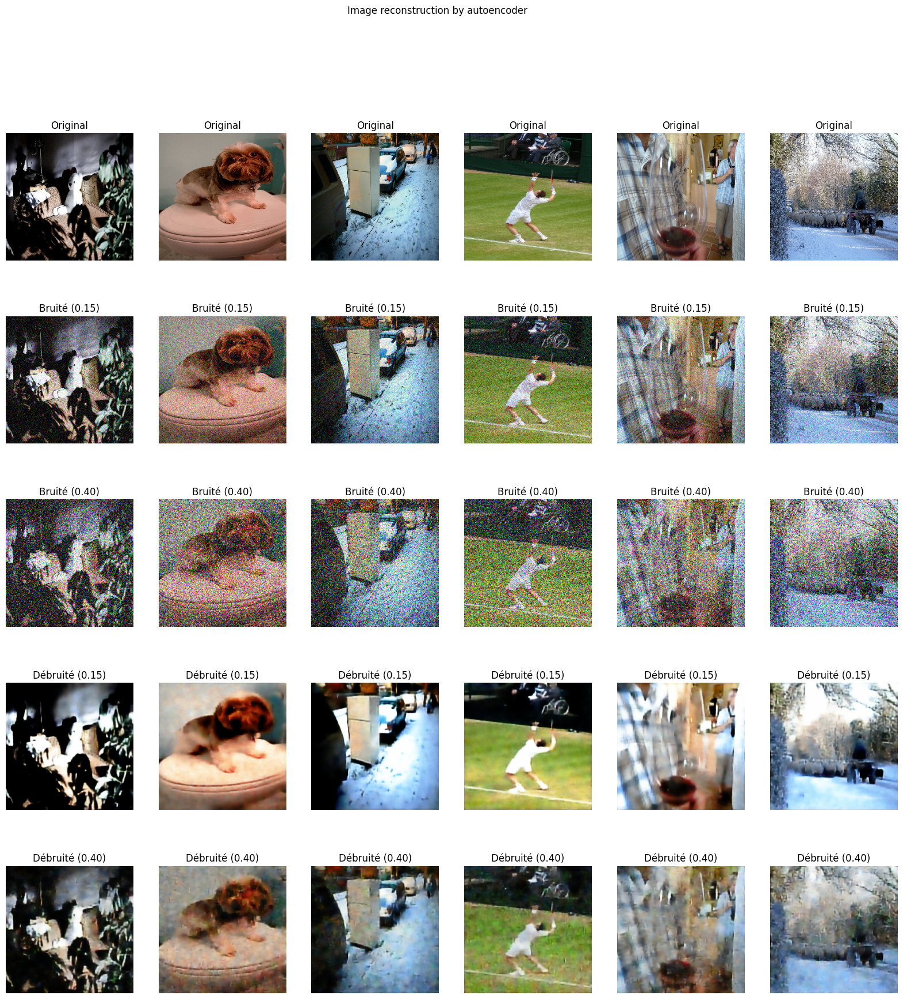

In [22]:
# Affichage des images originales, bruitées et débruitées
plt.figure(figsize=(20,20))
num_images_to_show = 6

for i in range(num_images_to_show):
    # Images originales
    ax = plt.subplot(5, num_images_to_show, i + 1)
    plt.imshow(y_test_015[i].reshape(img_height, img_width, rgb))
    plt.title("Original")
    plt.axis("off")
    
    # Images légèrement bruitées
    ax = plt.subplot(5, num_images_to_show, i + 1 + num_images_to_show)
    plt.imshow(X_test_015[i].reshape(img_height, img_width, rgb))
    plt.title("Bruité (0.15)")
    plt.axis("off")

    # Images fortement bruitées
    ax = plt.subplot(5, num_images_to_show, i + 1 + 2*num_images_to_show)
    plt.imshow(X_test_040[i].reshape(img_height, img_width, rgb))
    plt.title("Bruité (0.40)")
    plt.axis("off")
    
    # Images légèrement bruitées débruitées
    ax = plt.subplot(5, num_images_to_show, i + 1 + 3*num_images_to_show)
    plt.imshow(decoded_imgs_015[i].reshape(img_height, img_width, rgb))
    plt.title("Débruité (0.15)")
    plt.axis("off")

    # Images fortement bruitées débruitées
    ax = plt.subplot(5, num_images_to_show, i + 1 + 4*num_images_to_show)
    plt.imshow(decoded_imgs_040[i].reshape(img_height, img_width, rgb))
    plt.title("Débruité (0.40)")
    plt.axis("off")

plt.suptitle("Image reconstruction by autoencoder")
plt.show()

### Conclusion Générale

Dans ce projet, nous avons développé un modèle d'autoencodeur pour traiter des images bruitées, en utilisant un dataset d'images corrompues par du bruit gaussien à deux niveaux différents : léger (0.15) et fort (0.40). L'objectif principal était d'évaluer la capacité du modèle à reconstruire des images originales à partir de ces données bruitées.

#### Résultats et Évaluation

1. **Performance du Modèle** :
   - Les résultats du PSNR ont montré que le modèle a obtenu un PSNR moyen de 15.83 pour les images légèrement bruitées et de 20.76 pour les images fortement bruitées. Cela indique que le modèle a mieux réussi à reconstruire les images fortement bruitées, ce qui peut être attribué à son entraînement sur des données similaires.
   - Les valeurs du MSE ont également révélé des performances intéressantes, avec un MSE moyen de 0.027 pour les images légèrement bruitées et de 0.010 pour les images fortement bruitées. Ces résultats suggèrent que le modèle a appris à ignorer le bruit et à se concentrer sur les caractéristiques essentielles des images, en particulier dans des conditions de bruit plus élevé.

2. **Visualisation des Résultats** :
   - L'affichage des images originales, bruitées et débruitées a permis d'illustrer visuellement la capacité du modèle à reconstruire les images. Les reconstructions des images fortement bruitées étaient particulièrement impressionnantes, montrant que le modèle a réussi à récupérer des détails significatifs malgré la dégradation.

#### Implications et Perspectives

- Les résultats obtenus soulignent l'efficacité des autoencodeurs pour le débruitage d'images, même dans des conditions de bruit élevé. Cependant, les valeurs de PSNR et de MSE inférieures à des seuils idéaux indiquent qu'il existe encore des marges d'amélioration.
- Pour améliorer la qualité des reconstructions, plusieurs pistes peuvent être explorées :
  - **Optimisation des Hyperparamètres** : Ajuster le nombre d'époques, la taille du lot, et d'autres paramètres d'entraînement pourrait améliorer les performances.
  - **Architectures de Modèles Avancées** : L'utilisation de modèles plus complexes, tels que les réseaux de neurones convolutifs profonds ou les architectures de type U-Net, pourrait permettre de mieux capturer les détails des images.
  - **Techniques d'Ajustement des Données** : L'augmentation des données et d'autres techniques de prétraitement pourraient également contribuer à améliorer la robustesse du modèle.

#### Conclusion Finale

En somme, ce projet a démontré la capacité des autoencodeurs à traiter et à reconstruire des images bruitées, avec des résultats encourageants. Les analyses effectuées, tant quantitatives que qualitatives, fournissent des bases solides pour des travaux futurs dans le domaine du débruitage d'images et de l'apprentissage profond. L'exploration de nouvelles architectures et techniques d'entraînement pourrait ouvrir la voie à des améliorations significatives dans la qualité des reconstructions d'images.